<a href="https://colab.research.google.com/github/farukemrekaraca/ztm-tensorflow-machinelearning-deeplearning/blob/main/03_introduction_to_computer_vision_with_tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [6]:
import zipfile

!wget https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip

zip_ref = zipfile.ZipFile("pizza_steak.zip")
zip_ref.extractall()
zip_ref.close()

--2024-01-25 05:45:52--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.107.207, 74.125.197.207, 74.125.135.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.107.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip’

pizza_steak.zip     100%[===================>] 104.47M   106MB/s    in 1.0s    

2024-01-25 05:45:53 (106 MB/s) - ‘pizza_steak.zip’ saved [109540975/109540975]



In [7]:
!ls pizza_steak/train/pizza

1008104.jpg  1572608.jpg  2097315.jpg  2572958.jpg  3084957.jpg  3693710.jpg  668944.jpg
1008144.jpg  1573562.jpg  2098014.jpg  2574896.jpg  3102271.jpg  3699992.jpg  670201.jpg
1008844.jpg  1576248.jpg  2104569.jpg  2576168.jpg  3105724.jpg  3702863.jpg  674188.jpg
1008941.jpg  1577871.jpg  2110257.jpg  2577373.jpg  3109486.jpg  3703769.jpg  676432.jpg
1011404.jpg  1584379.jpg  2112757.jpg  2577377.jpg  312479.jpg	 3704879.jpg  682201.jpg
102037.jpg   1593665.jpg  2121603.jpg  2581276.jpg  3128495.jpg  3705479.jpg  68684.jpg
1026922.jpg  1593835.jpg  2126352.jpg  2584745.jpg  3148119.jpg  370643.jpg   698251.jpg
1029698.jpg  1600705.jpg  2126709.jpg  2587918.jpg  3164761.jpg  3712344.jpg  702165.jpg
1033251.jpg  1608000.jpg  2135635.jpg  2587921.jpg  3168266.jpg  3713343.jpg  704161.jpg
1035854.jpg  1617418.jpg  2137341.jpg  259449.jpg   3170114.jpg  372275.jpg   709273.jpg
1038357.jpg  1620560.jpg  2142812.jpg  2602611.jpg  3173779.jpg  3742272.jpg  709947.jpg
1040878.jpg  1620761.jp

In [8]:
import os

for dirpath, dirnames, filenames in os.walk("pizza_steak"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 2 directories and 0 images in 'pizza_steak'.
There are 2 directories and 0 images in 'pizza_steak/test'.
There are 0 directories and 250 images in 'pizza_steak/test/pizza'.
There are 0 directories and 250 images in 'pizza_steak/test/steak'.
There are 2 directories and 0 images in 'pizza_steak/train'.
There are 0 directories and 750 images in 'pizza_steak/train/pizza'.
There are 0 directories and 750 images in 'pizza_steak/train/steak'.


In [9]:
num_steak_images_train =  len(os.listdir("pizza_steak/train/steak"))

num_steak_images_train

750

In [10]:
import pathlib
import numpy as np
data_dir = pathlib.Path("pizza_steak/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['pizza' 'steak']


In [159]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir, target_class):
  target_folder = target_dir + "/" + target_class

  random_image = random.sample(os.listdir(target_folder), 1)
  print(random_image)

  img = mpimg.imread(target_folder + "/" + random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off");

  print(f"Image shape: {img.shape}")

  return img

['1869467.jpg']
Image shape: (512, 512, 3)


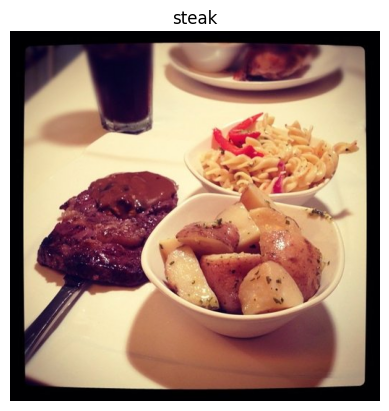

In [12]:
img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="steak")

['1836888.jpg']
Image shape: (512, 512, 3)


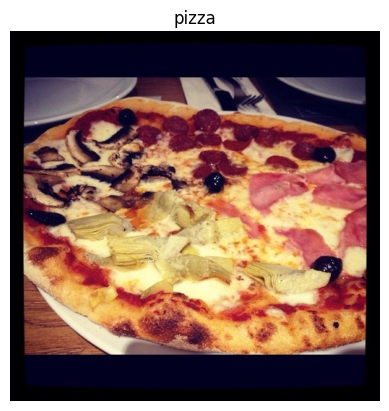

In [13]:
img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="pizza")

In [14]:
img

array([[[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       ...,

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]]], dtype=uint8)

In [15]:
tf.constant(img)

<tf.Tensor: shape=(512, 512, 3), dtype=uint8, numpy=
array([[[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       ...,

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]],

       [[0, 0, 2],
        [0, 0, 2],
        [0, 0, 2],
        ...,
        [0, 0, 2],
        [0, 0, 2],
        [0, 0, 2]]], dtype=uint8)>

In [16]:
img.shape

(512, 512, 3)

In [17]:
img/255.

array([[[0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        ...,
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314]],

       [[0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        ...,
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314]],

       [[0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        ...,
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314]],

       ...,

       [[0.        , 0.        , 0.00784314],
        [0.        , 0.        , 0.00784314],
        [0.        , 0

In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tf.random.set_seed(42)

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = "pizza_steak/train"
test_dir = "pizza_steak/test"

train_data = train_datagen.flow_from_directory(directory=train_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode="binary",
                                               seed=42)

valid_data = test_datagen.flow_from_directory(directory=test_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode="binary",
                                               seed=42)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [ ]:
model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224, 224, 3)),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

model_1.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 14s 179ms/step - loss: 0.5583 - accuracy: 0.7127 - val_loss: 0.4248 - val_accuracy: 0.8120
Epoch 2/5
47/47 [==============================] - 6s 137ms/step - loss: 0.4423 - accuracy: 0.8087 - val_loss: 0.3735 - val_accuracy: 0.8360
Epoch 3/5
47/47 [==============================] - 10s 207ms/step - loss: 0.3997 - accuracy: 0.8247 - val_loss: 0.3327 - val_accuracy: 0.8840
Epoch 4/5
47/47 [==============================] - 7s 142ms/step - loss: 0.3619 - accuracy: 0.8527 - val_loss: 0.3431 - val_accuracy: 0.8760
Epoch 5/5
47/47 [==============================] - 5s 114ms/step - loss: 0.3267 - accuracy: 0.8653 - val_loss: 0.3201 - val_accuracy: 0.8740


In [ ]:
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_7 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 10)      0         
 D)                                                              
                                                                 
 conv2d_8 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_9 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 10)        0         
 g2D)                                                 

In [ ]:
tf.random.set_seed(42)

model_2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)),
    tf.keras.layers.Dense(4, activation="relu"),
    tf.keras.layers.Dense(4, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

model_2.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

history_2 = model_2.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 6s 108ms/step - loss: 0.8986 - accuracy: 0.4820 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 2/5
47/47 [==============================] - 6s 118ms/step - loss: 0.6932 - accuracy: 0.4840 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/5
47/47 [==============================] - 5s 104ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 4/5
47/47 [==============================] - 5s 106ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 5/5
47/47 [==============================] - 6s 127ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000


In [ ]:
model_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 150528)            0         
                                                                 
 dense_2 (Dense)             (None, 4)                 602116    
                                                                 
 dense_3 (Dense)             (None, 4)                 20        
                                                                 
 dense_4 (Dense)             (None, 1)                 5         
                                                                 
Total params: 602141 (2.30 MB)
Trainable params: 602141 (2.30 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
tf.random.set_seed(42)

model_3 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)),
    tf.keras.layers.Dense(10, activation="relu"),
    tf.keras.layers.Dense(10, activation="relu"),
    tf.keras.layers.Dense(10, activation="relu"),
    tf.keras.layers.Dense(10, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

model_3.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

history_3 = model_3.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 7s 119ms/step - loss: 1.2802 - accuracy: 0.4947 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 2/5
47/47 [==============================] - 5s 109ms/step - loss: 0.6933 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
47/47 [==============================] - 5s 107ms/step - loss: 0.6933 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/5
47/47 [==============================] - 6s 122ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/5
47/47 [==============================] - 5s 106ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000


In [ ]:
model_3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 150528)            0         
                                                                 
 dense_5 (Dense)             (None, 10)                1505290   
                                                                 
 dense_6 (Dense)             (None, 10)                110       
                                                                 
 dense_7 (Dense)             (None, 10)                110       
                                                                 
 dense_8 (Dense)             (None, 10)                110       
                                                                 
 dense_9 (Dense)             (None, 1)                 11        
                                                                 
Total params: 1505631 (5.74 MB)
Trainable params: 1505

['1248337.jpg']
Image shape: (364, 512, 3)
['875262.jpg']
Image shape: (341, 512, 3)


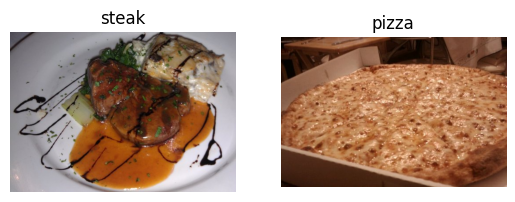

In [ ]:
plt.figure()
plt.subplot(1, 2, 1)
steak_img = view_random_image("pizza_steak/train/", "steak")
plt.subplot(1, 2, 2)
pizza_img = view_random_image("pizza_steak/train/", "pizza")

In [19]:
def multiple_random(iterations):
  for i in range(iterations):
    plt.figure()
    plt.subplot(1, 2, 1)
    steak_img = view_random_image("pizza_steak/train/", "steak")
    plt.subplot(1, 2, 2)
    pizza_img = view_random_image("pizza_steak/train/", "pizza")


['3171085.jpg']
Image shape: (512, 512, 3)
['823104.jpg']
Image shape: (306, 512, 3)
['1684438.jpg']
Image shape: (512, 512, 3)
['1671531.jpg']
Image shape: (512, 512, 3)
['1348047.jpg']
Image shape: (512, 512, 3)
['2486277.jpg']
Image shape: (512, 512, 3)
['2643906.jpg']
Image shape: (512, 512, 3)
['1705747.jpg']
Image shape: (512, 512, 3)
['2771149.jpg']
Image shape: (512, 512, 3)
['34632.jpg']
Image shape: (384, 512, 3)
['1550997.jpg']
Image shape: (512, 512, 3)
['3589437.jpg']
Image shape: (288, 512, 3)
['568972.jpg']
Image shape: (512, 512, 3)
['2924941.jpg']
Image shape: (512, 508, 3)
['141056.jpg']
Image shape: (512, 341, 3)
['1678284.jpg']
Image shape: (512, 384, 3)
['9555.jpg']
Image shape: (384, 512, 3)
['918506.jpg']
Image shape: (384, 512, 3)
['101312.jpg']
Image shape: (343, 512, 3)
['774142.jpg']
Image shape: (384, 512, 3)


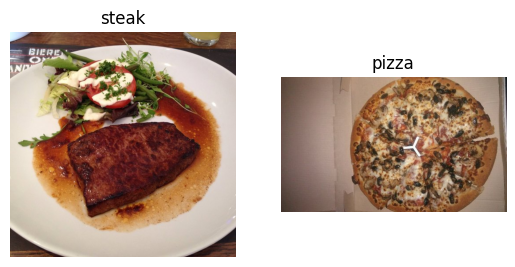

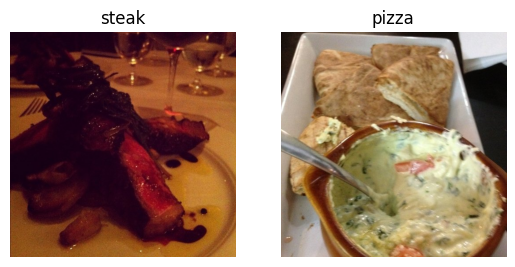

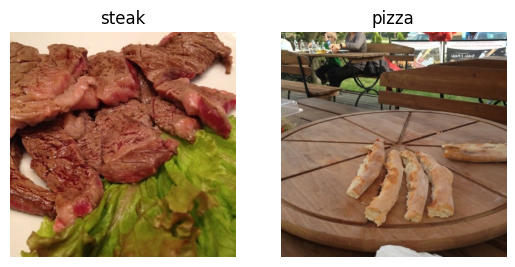

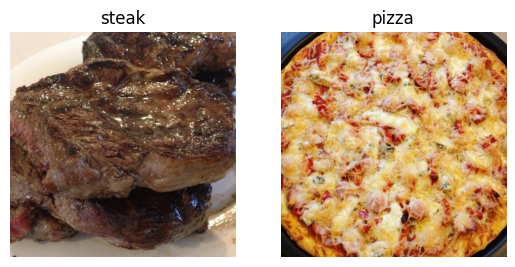

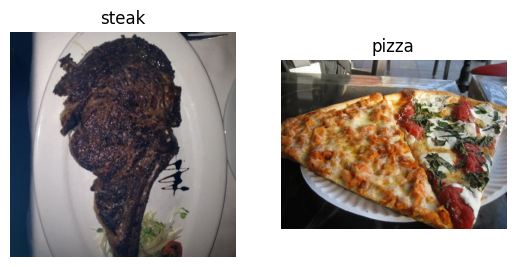

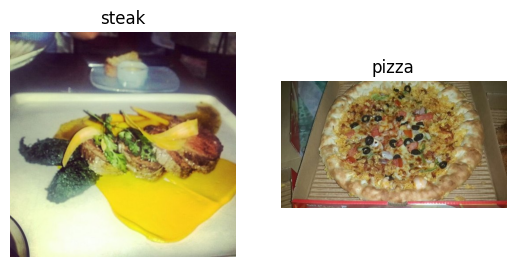

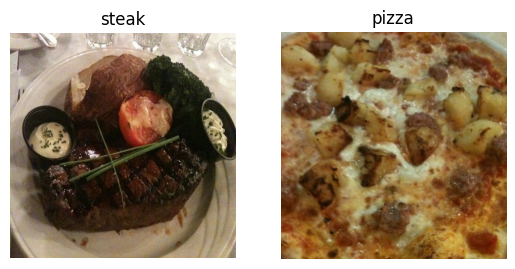

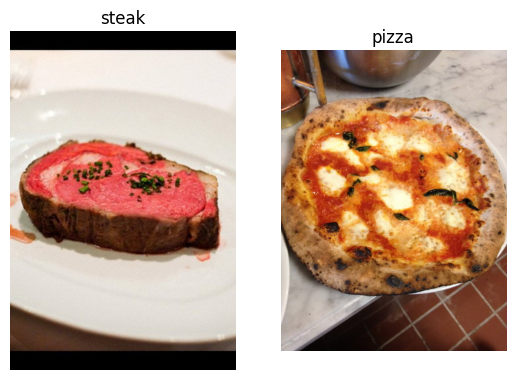

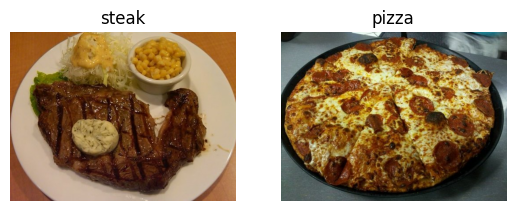

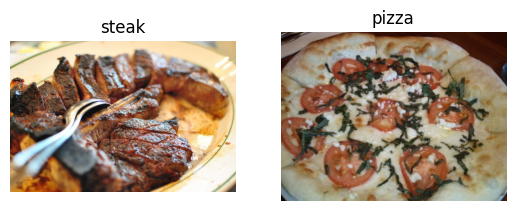

In [20]:
multiple_random(10)

In [21]:
!nvidia-smi

Thu Jan 25 05:46:15 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0              28W /  70W |    105MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

In [ ]:
train_data = train_datagen.flow_from_directory(directory=train_dir,
                                               target_size=(224, 224),
                                               class_mode="binary",
                                               batch_size=32)

test_data = test_datagen.flow_from_directory(directory=test_dir,
                                             target_size=(224, 224),
                                             class_mode="binary",
                                             batch_size=32)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [ ]:
images, labels = train_data.next()
len(images), len(labels)

(32, 32)

In [ ]:
images[:2], images[0].shape

(array([[[[0.47058827, 0.40784317, 0.34509805],
          [0.48627454, 0.42352945, 0.36078432],
          [0.48627454, 0.43529415, 0.37254903],
          ...,
          [0.82745105, 0.7137255 , 0.48627454],
          [0.8431373 , 0.7372549 , 0.5294118 ],
          [0.87843144, 0.77647066, 0.58431375]],
 
         [[0.50980395, 0.427451  , 0.36078432],
          [0.5058824 , 0.42352945, 0.35686275],
          [0.5137255 , 0.4431373 , 0.3647059 ],
          ...,
          [0.82745105, 0.7058824 , 0.48235297],
          [0.82745105, 0.70980394, 0.49803925],
          [0.8431373 , 0.73333335, 0.5372549 ]],
 
         [[0.5254902 , 0.427451  , 0.34901962],
          [0.5372549 , 0.43921572, 0.36078432],
          [0.5372549 , 0.45098042, 0.36078432],
          ...,
          [0.82745105, 0.7019608 , 0.4784314 ],
          [0.82745105, 0.7058824 , 0.4901961 ],
          [0.8352942 , 0.7176471 , 0.5137255 ]],
 
         ...,
 
         [[0.77647066, 0.5647059 , 0.2901961 ],
          [0.77647

In [ ]:
images[7], images[7].shape

(array([[[0.30588236, 0.17254902, 0.227451  ],
         [0.34901962, 0.21960786, 0.25490198],
         [0.4039216 , 0.2784314 , 0.2901961 ],
         ...,
         [0.16470589, 0.02745098, 0.1137255 ],
         [0.16862746, 0.01960784, 0.11764707],
         [0.15686275, 0.00784314, 0.10588236]],
 
        [[0.28235295, 0.14901961, 0.20392159],
         [0.34117648, 0.21176472, 0.24705884],
         [0.42352945, 0.29803923, 0.30980393],
         ...,
         [0.17254902, 0.02352941, 0.1137255 ],
         [0.1764706 , 0.02745098, 0.11764707],
         [0.16078432, 0.01176471, 0.10980393]],
 
        [[0.26666668, 0.13333334, 0.19607845],
         [0.32941177, 0.20000002, 0.23529413],
         [0.42352945, 0.29803923, 0.31764707],
         ...,
         [0.19215688, 0.04313726, 0.13333334],
         [0.1764706 , 0.02745098, 0.11764707],
         [0.16862746, 0.03137255, 0.1254902 ]],
 
        ...,
 
        [[0.62352943, 0.5803922 , 0.5647059 ],
         [0.6039216 , 0.56078434, 0.54509

In [ ]:
labels

array([1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0., 1., 0., 1.],
      dtype=float32)

In [1]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

In [ ]:
# baseline model
model_4 = Sequential([
    Conv2D(filters=10,
           kernel_size=(3, 3),
           strides=(1, 1),
           padding="valid", # same = output and input shame are same, valid = output is compressed
           activation="relu",
           input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation="relu"),
    Conv2D(10, 3, activation="relu"),
    Flatten(),
    Dense(1, activation="sigmoid")
])

In [ ]:
model_4.compile(loss="binary_crossentropy",
                optimizer=Adam(),
                metrics=["accuracy"])

In [ ]:
model_4.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 conv2d_14 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 conv2d_15 (Conv2D)          (None, 218, 218, 10)      910       
                                                                 
 flatten_5 (Flatten)         (None, 475240)            0         
                                                                 
 dense_11 (Dense)            (None, 1)                 475241    
                                                                 
Total params: 477341 (1.82 MB)
Trainable params: 477341 (1.82 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
len(train_data), len(test_data)

(47, 16)

In [ ]:
history_4 = model_4.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data=test_data,
            validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 7s 118ms/step - loss: 0.8751 - accuracy: 0.6387 - val_loss: 0.4632 - val_accuracy: 0.8140
Epoch 2/5
47/47 [==============================] - 6s 128ms/step - loss: 0.4452 - accuracy: 0.8053 - val_loss: 0.4236 - val_accuracy: 0.8140
Epoch 3/5
47/47 [==============================] - 5s 116ms/step - loss: 0.2974 - accuracy: 0.8947 - val_loss: 0.4952 - val_accuracy: 0.7620
Epoch 4/5
47/47 [==============================] - 6s 128ms/step - loss: 0.1540 - accuracy: 0.9533 - val_loss: 0.4716 - val_accuracy: 0.8060
Epoch 5/5
47/47 [==============================] - 5s 116ms/step - loss: 0.0662 - accuracy: 0.9853 - val_loss: 0.5526 - val_accuracy: 0.8080


In [ ]:
model_1.evaluate(test_data), model_4.evaluate(test_data)

16/16 [==============================] - 2s 111ms/step - loss: 0.5526 - accuracy: 0.8080


([0.3201265335083008, 0.8740000128746033],
 [0.5526406168937683, 0.8080000281333923])

In [ ]:
model_1.summary(), model_4.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_7 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 10)      0         
 D)                                                              
                                                                 
 conv2d_8 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_9 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 10)        0         
 g2D)                                                 

(None, None)

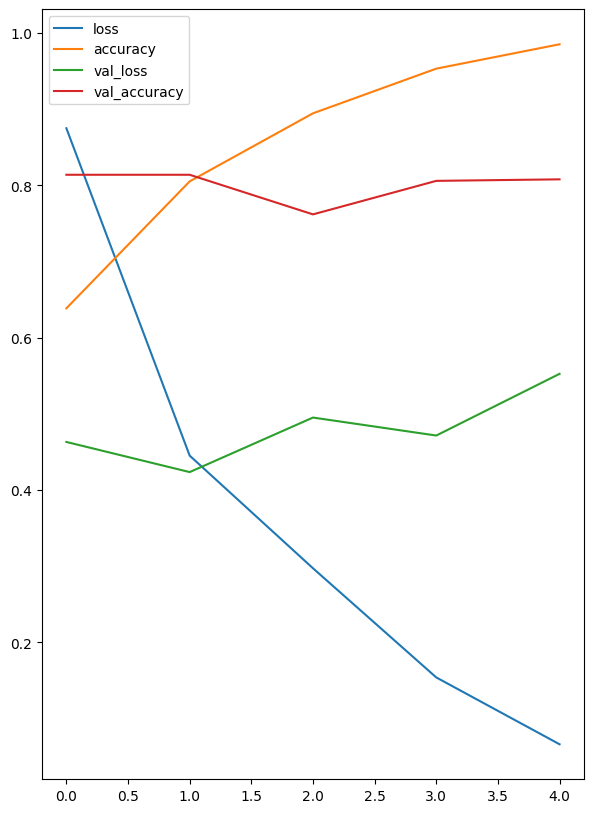

In [ ]:
import pandas as pd
pd.DataFrame(history_4.history).plot(figsize=(7, 10));

In [88]:
def plot_loss_curves(history):
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  plt.plot(epochs, loss, label="training_loss")
  plt.plot(epochs, val_loss, label="val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  plt.figure()
  plt.plot(epochs, accuracy, label="training_accuracy")
  plt.plot(epochs, val_accuracy, label="val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend();


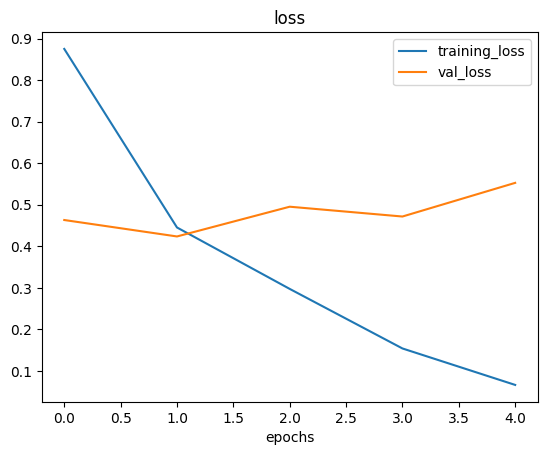

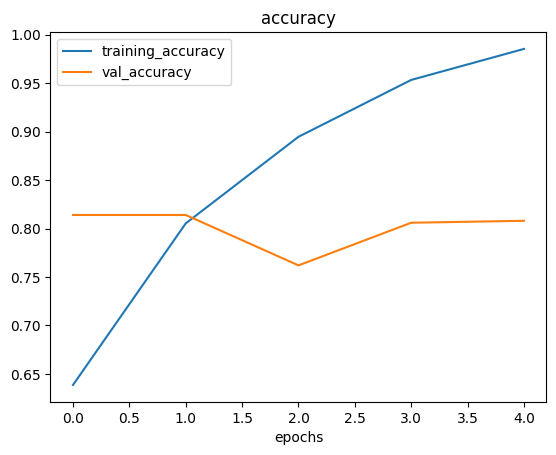

In [ ]:
plot_loss_curves(history_4)

In [ ]:
model_5 = Sequential([
    Conv2D(10, 3, activation="relu", input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

In [ ]:
model_5.compile(loss="binary_crossentropy", optimizer=Adam(), metrics=["accuracy"])

In [ ]:
history_5 = model_5.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data))

Epoch 1/5
47/47 [==============================] - 8s 117ms/step - loss: 0.6282 - accuracy: 0.6087 - val_loss: 0.4651 - val_accuracy: 0.7920
Epoch 2/5
47/47 [==============================] - 6s 119ms/step - loss: 0.4981 - accuracy: 0.7733 - val_loss: 0.4162 - val_accuracy: 0.8340
Epoch 3/5
47/47 [==============================] - 5s 112ms/step - loss: 0.4531 - accuracy: 0.8007 - val_loss: 0.3995 - val_accuracy: 0.8200
Epoch 4/5
47/47 [==============================] - 5s 109ms/step - loss: 0.4328 - accuracy: 0.8153 - val_loss: 0.4086 - val_accuracy: 0.8300
Epoch 5/5
47/47 [==============================] - 6s 124ms/step - loss: 0.4163 - accuracy: 0.8187 - val_loss: 0.3642 - val_accuracy: 0.8420


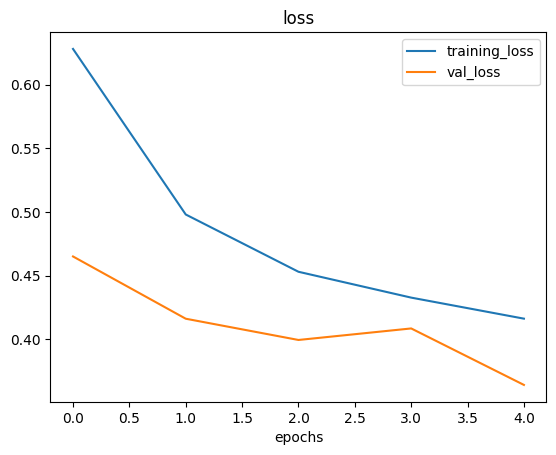

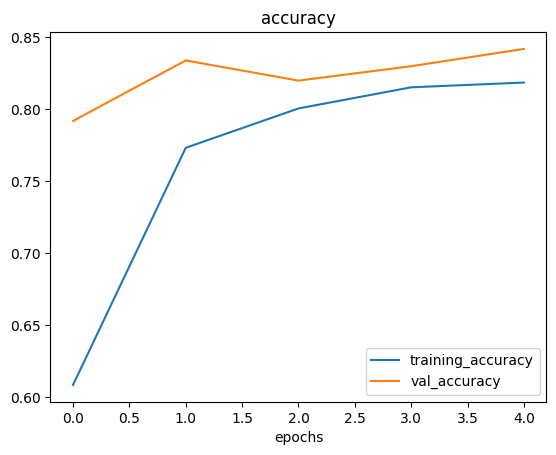

In [ ]:
plot_loss_curves(history_5)

In [78]:
# with data augmentation
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                             rotation_range=0.2,
                                             shear_range=0.2,
                                             zoom_range=0.2,
                                             width_shift_range=0.2,
                                             height_shift_range=0.2,
                                             horizontal_flip=True)

# without data augmentation
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

In [79]:
IMG_SIZE = (224, 224)

print("Augmented training data:")
train_data_augmented =  train_datagen_augmented.flow_from_directory(train_dir,
                                                                    target_size=IMG_SIZE,
                                                                    class_mode="binary",
                                                                    batch_size=32,
                                                                    shuffle=False)

print("Non-augmented training data:")
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=IMG_SIZE,
                                               class_mode="binary",
                                               batch_size=32,
                                               shuffle=False)

print("Non-augmented test data:")
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=IMG_SIZE,
                                             class_mode="binary",
                                             batch_size=32)

Augmented training data:
Found 1500 images belonging to 2 classes.
Non-augmented training data:
Found 1500 images belonging to 2 classes.
Non-augmented test data:
Found 500 images belonging to 2 classes.


In [80]:
images, labels = train_data.next() # gets the next batch
augmented_images, augmented_labels = train_data_augmented.next()

Showing image number 26


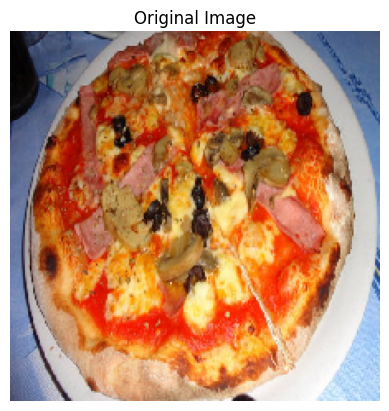

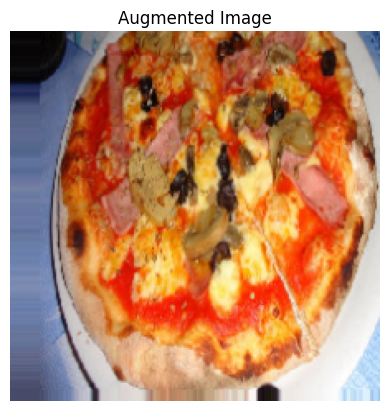

In [81]:
import random
random_number = random.randint(0, 32) # 32 because batch_size is 32
print(f"Showing image number {random_number}")
plt.imshow(images[random_number])
plt.title("Original Image")
plt.axis(False)
plt.figure()
plt.imshow(augmented_images[random_number])
plt.title("Augmented Image")
plt.axis(False)
plt.show(); # optional

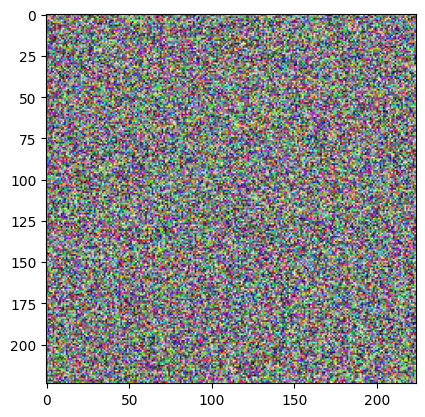

In [45]:
noisy_img = np.random.rand(224, 224, 3)
img = plt.imshow(tf.constant(noisy_img))

In [85]:
model_6 = Sequential([
    Conv2D(10, 3, activation="relu", input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_6.compile(loss="binary_crossentropy", optimizer=Adam(), metrics=["accuracy"])

history_6 = model_6.fit(train_data_augmented,
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 22s 431ms/step - loss: 0.7962 - accuracy: 0.5413 - val_loss: 0.6907 - val_accuracy: 0.5000
Epoch 2/5
47/47 [==============================] - 20s 429ms/step - loss: 0.6949 - accuracy: 0.4807 - val_loss: 0.6835 - val_accuracy: 0.6760
Epoch 3/5
47/47 [==============================] - 19s 410ms/step - loss: 0.6938 - accuracy: 0.5440 - val_loss: 0.6702 - val_accuracy: 0.7160
Epoch 4/5
47/47 [==============================] - 22s 452ms/step - loss: 0.6839 - accuracy: 0.5880 - val_loss: 0.6473 - val_accuracy: 0.7520
Epoch 5/5
47/47 [==============================] - 20s 430ms/step - loss: 0.7271 - accuracy: 0.6380 - val_loss: 0.6243 - val_accuracy: 0.5900


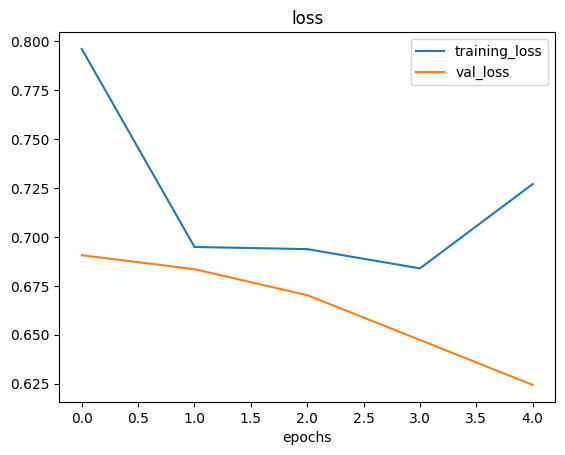

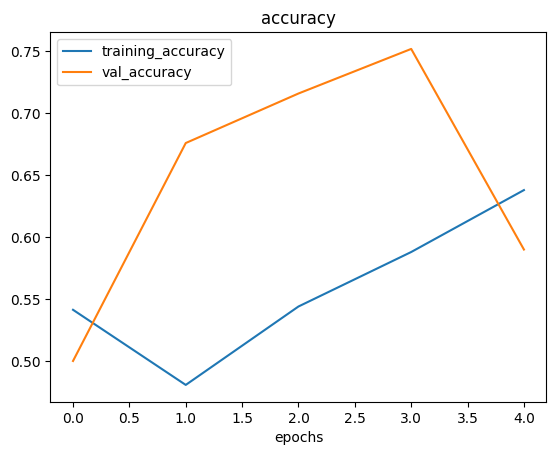

In [89]:
plot_loss_curves(history_6)

In [90]:
IMG_SIZE = (224, 224)

train_data_augmented_shuffled =  train_datagen_augmented.flow_from_directory(train_dir,
                                                                    target_size=IMG_SIZE,
                                                                    class_mode="binary",
                                                                    batch_size=32,
                                                                    shuffle=True)

test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=IMG_SIZE,
                                             class_mode="binary",
                                             batch_size=32)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [91]:
model_7 = Sequential([
    Conv2D(10, 3, activation="relu", input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_7.compile(loss="binary_crossentropy", optimizer=Adam(), metrics=["accuracy"])

history_7 = model_7.fit(train_data_augmented_shuffled,
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 22s 411ms/step - loss: 0.6042 - accuracy: 0.6787 - val_loss: 0.4485 - val_accuracy: 0.7960
Epoch 2/5
47/47 [==============================] - 20s 424ms/step - loss: 0.5005 - accuracy: 0.7693 - val_loss: 0.3745 - val_accuracy: 0.8480
Epoch 3/5
47/47 [==============================] - 20s 436ms/step - loss: 0.4547 - accuracy: 0.7893 - val_loss: 0.3309 - val_accuracy: 0.8620
Epoch 4/5
47/47 [==============================] - 19s 415ms/step - loss: 0.4455 - accuracy: 0.8007 - val_loss: 0.3352 - val_accuracy: 0.8580
Epoch 5/5
47/47 [==============================] - 20s 426ms/step - loss: 0.4359 - accuracy: 0.8020 - val_loss: 0.3218 - val_accuracy: 0.8660


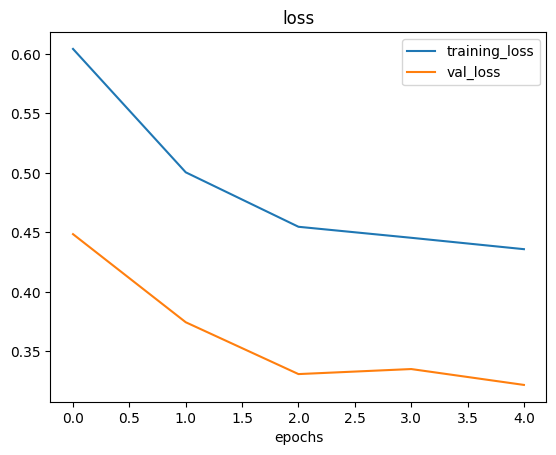

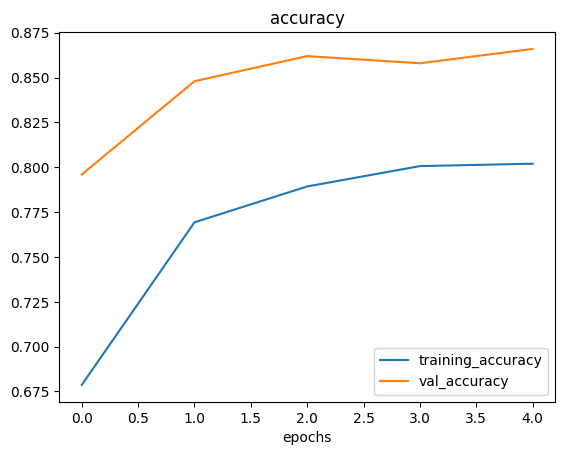

In [92]:
plot_loss_curves(history_7)

In [93]:
model_8 = Sequential([
    Conv2D(10, 3, activation="relu", input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_8.compile(loss="binary_crossentropy", optimizer=Adam(), metrics=["accuracy"])

history_8 = model_8.fit(train_data_augmented_shuffled,
                        epochs=5,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 23s 448ms/step - loss: 0.6898 - accuracy: 0.5273 - val_loss: 0.6805 - val_accuracy: 0.5700
Epoch 2/5
47/47 [==============================] - 20s 425ms/step - loss: 0.6709 - accuracy: 0.5733 - val_loss: 0.6231 - val_accuracy: 0.6300
Epoch 3/5
47/47 [==============================] - 19s 407ms/step - loss: 0.5942 - accuracy: 0.6920 - val_loss: 0.4643 - val_accuracy: 0.8020
Epoch 4/5
47/47 [==============================] - 20s 434ms/step - loss: 0.5275 - accuracy: 0.7413 - val_loss: 0.4261 - val_accuracy: 0.8320
Epoch 5/5
47/47 [==============================] - 20s 427ms/step - loss: 0.4858 - accuracy: 0.7740 - val_loss: 0.3660 - val_accuracy: 0.8360


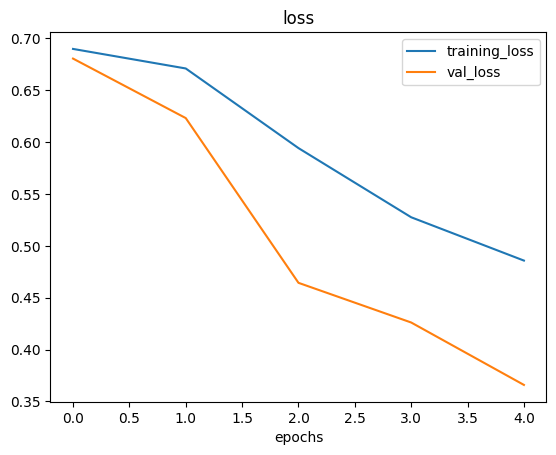

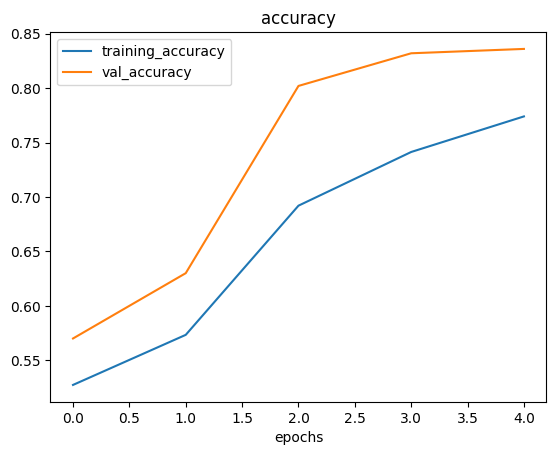

In [94]:
plot_loss_curves(history_8)

In [95]:
model_8 = Sequential([
    Conv2D(10, 3, activation="relu", input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation="sigmoid")
])

model_8.compile(loss="binary_crossentropy", optimizer=Adam(), metrics=["accuracy"])

history_8 = model_8.fit(train_data_augmented_shuffled,
                        epochs=10,
                        steps_per_epoch=len(train_data_augmented_shuffled),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/10
47/47 [==============================] - 22s 422ms/step - loss: 0.6914 - accuracy: 0.5020 - val_loss: 0.6683 - val_accuracy: 0.5840
Epoch 2/10
47/47 [==============================] - 24s 502ms/step - loss: 0.6167 - accuracy: 0.6767 - val_loss: 0.5800 - val_accuracy: 0.6960
Epoch 3/10
47/47 [==============================] - 20s 436ms/step - loss: 0.5580 - accuracy: 0.7113 - val_loss: 0.5036 - val_accuracy: 0.7680
Epoch 4/10
47/47 [==============================] - 23s 496ms/step - loss: 0.5233 - accuracy: 0.7533 - val_loss: 0.3923 - val_accuracy: 0.8400
Epoch 5/10
47/47 [==============================] - 26s 556ms/step - loss: 0.5071 - accuracy: 0.7613 - val_loss: 0.4439 - val_accuracy: 0.8040
Epoch 6/10
47/47 [==============================] - 26s 541ms/step - loss: 0.4838 - accuracy: 0.7753 - val_loss: 0.4633 - val_accuracy: 0.7940
Epoch 7/10
47/47 [==============================] - 25s 537ms/step - loss: 0.4626 - accuracy: 0.7847 - val_loss: 0.4514 - val_accuracy: 0.7800

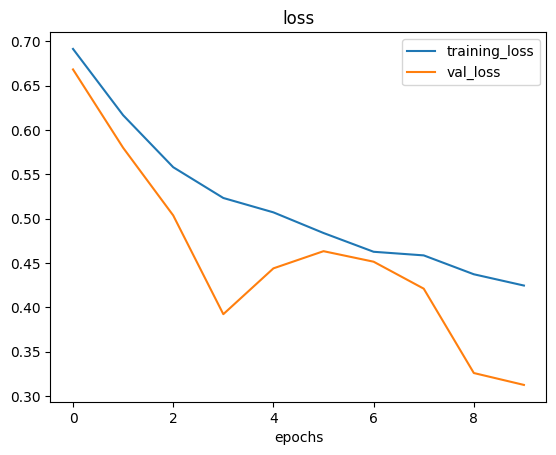

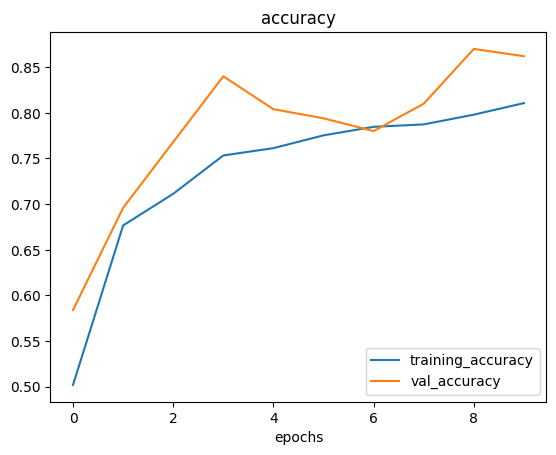

In [96]:
plot_loss_curves(history_8)

In [101]:
!wget https://img.freepik.com/free-photo/juicy-steak-medium-rare-beef-with-spices-grilled-vegetables_24972-2328.jpg?size=626&ext=jpg&ga=GA1.1.632798143.1706140800&semt=sph

--2024-01-25 07:09:09--  https://img.freepik.com/free-photo/juicy-steak-medium-rare-beef-with-spices-grilled-vegetables_24972-2328.jpg?size=626
Resolving img.freepik.com (img.freepik.com)... 23.41.4.217, 23.41.4.212, 2600:1409:3800::6862:7693
Connecting to img.freepik.com (img.freepik.com)|23.41.4.217|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 86860 (85K) [image/jpeg]
Saving to: ‘juicy-steak-medium-rare-beef-with-spices-grilled-vegetables_24972-2328.jpg?size=626’

juicy-steak-medium- 100%[===================>]  84.82K  --.-KB/s    in 0.01s   

2024-01-25 07:09:10 (7.80 MB/s) - ‘juicy-steak-medium-rare-beef-with-spices-grilled-vegetables_24972-2328.jpg?size=626’ saved [86860/86860]



In [102]:
steak = mpimg.imread("/content/juicy-steak-medium-rare-beef-with-spices-grilled-vegetables_24972-2328.jpg?size=626")

In [104]:
steak.shape

(417, 626, 3)

(-0.5, 625.5, 416.5, -0.5)

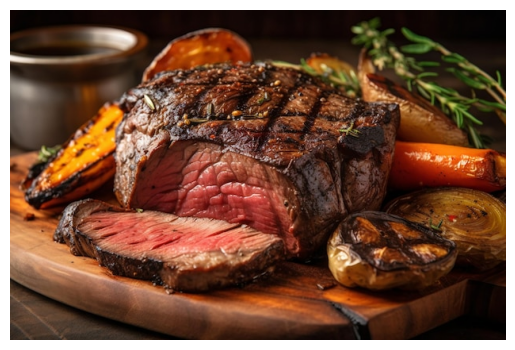

In [106]:
plt.imshow(steak)
plt.axis(False)

In [107]:
def load_and_prep_image(filename, img_shape=224):
  # Read image
  img = tf.io.read_file(filename)
  # Turn image to tensor
  img = tf.image.decode_image(img)
  # Resize image
  img = tf.image.resize(img, [img_shape, img_shape])
  # Rescale image
  img = img / 255.
  # Return image
  return img

In [110]:
steak = load_and_prep_image("/content/juicy-steak-medium-rare-beef-with-spices-grilled-vegetables_24972-2328.jpg?size=626")

In [111]:
steak.shape, steak

(TensorShape([224, 224, 3]),
 <tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.05098039, 0.01176471, 0.00392157],
         [0.05098039, 0.01176471, 0.00392157],
         [0.04705882, 0.01568628, 0.00784314],
         ...,
         [0.00784314, 0.01568628, 0.01176471],
         [0.01176471, 0.01176471, 0.01176471],
         [0.01399685, 0.00615371, 0.01007528]],
 
        [[0.05098039, 0.01176471, 0.00392157],
         [0.05098039, 0.01176471, 0.00663515],
         [0.04705882, 0.01568628, 0.00784314],
         ...,
         [0.01176471, 0.01176471, 0.01176471],
         [0.01176471, 0.01176471, 0.01176471],
         [0.01291141, 0.00506828, 0.00898985]],
 
        [[0.05098039, 0.01176471, 0.00392157],
         [0.04826681, 0.01447829, 0.00784314],
         [0.04705882, 0.01568628, 0.00784314],
         ...,
         [0.01176471, 0.01176471, 0.01176471],
         [0.01176471, 0.01176471, 0.01176471],
         [0.01568628, 0.00784314, 0.01176471]],
 
        ...,
 
   

(-0.5, 223.5, 223.5, -0.5)

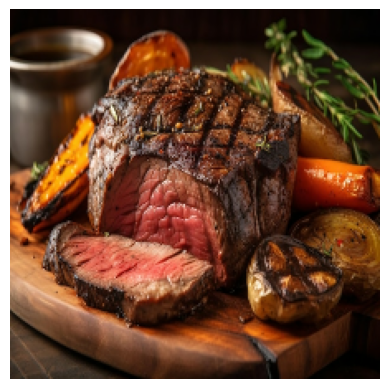

In [114]:
plt.imshow(steak)
plt.axis(False)

In [118]:
pred = model_7.predict(tf.expand_dims(steak, axis=0))
pred

1/1 [==============================] - 0s 147ms/step


array([[0.84840167]], dtype=float32)

In [119]:
class_names

array(['pizza', 'steak'], dtype='<U5')

In [121]:
pred_class = class_names[int(tf.round(pred))]
pred_class

'steak'

In [138]:
def pred_and_plot(filename, model=model_7, class_names=class_names):
  image = load_and_prep_image(filename)
  pred = model.predict(tf.expand_dims(image, axis=0))
  pred_class = class_names[int(tf.round(pred))]
  plt.imshow(image)
  plt.title(f"Predicted class is {pred_class}")
  plt.axis(False)

1/1 [==============================] - 0s 20ms/step


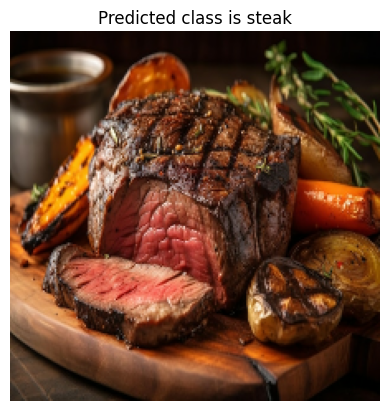

In [139]:
pred_and_plot("/content/juicy-steak-medium-rare-beef-with-spices-grilled-vegetables_24972-2328.jpg?size=626")

In [130]:
!wget https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTL0-V6SrvwBhupOB3Barese7B8GL7_2giUQOt5qM7BPw&s

/bin/bash: line 1: s: command not found
--2024-01-25 07:29:14--  https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTL0-V6SrvwBhupOB3Barese7B8GL7_2giUQOt5qM7BPw
Resolving encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)... 74.125.197.100, 74.125.197.139, 74.125.197.113, ...
Connecting to encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)|74.125.197.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10199 (10.0K) [image/jpeg]
Saving to: ‘images?q=tbn:ANd9GcTL0-V6SrvwBhupOB3Barese7B8GL7_2giUQOt5qM7BPw.1’

images?q=tbn:ANd9Gc 100%[===================>]   9.96K  --.-KB/s    in 0s      

2024-01-25 07:29:14 (102 MB/s) - ‘images?q=tbn:ANd9GcTL0-V6SrvwBhupOB3Barese7B8GL7_2giUQOt5qM7BPw.1’ saved [10199/10199]



1/1 [==============================] - 0s 18ms/step


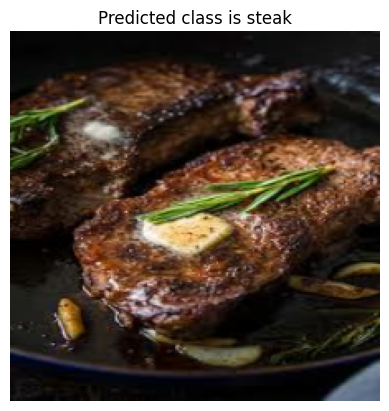

In [140]:
pred_and_plot("/content/images?q=tbn:ANd9GcTL0-V6SrvwBhupOB3Barese7B8GL7_2giUQOt5qM7BPw.1")

In [133]:
!wget https://media-cdn.tripadvisor.com/media/photo-s/0b/52/88/3a/ince-hamurlu-uygun-fiyatli.jpg

--2024-01-25 07:31:12--  https://media-cdn.tripadvisor.com/media/photo-s/0b/52/88/3a/ince-hamurlu-uygun-fiyatli.jpg
Resolving media-cdn.tripadvisor.com (media-cdn.tripadvisor.com)... 151.101.2.38, 151.101.66.38, 151.101.130.38, ...
Connecting to media-cdn.tripadvisor.com (media-cdn.tripadvisor.com)|151.101.2.38|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 45365 (44K) [image/jpeg]
Saving to: ‘ince-hamurlu-uygun-fiyatli.jpg’

ince-hamurlu-uygun- 100%[===================>]  44.30K  --.-KB/s    in 0.008s  

2024-01-25 07:31:12 (5.47 MB/s) - ‘ince-hamurlu-uygun-fiyatli.jpg’ saved [45365/45365]



1/1 [==============================] - 0s 18ms/step


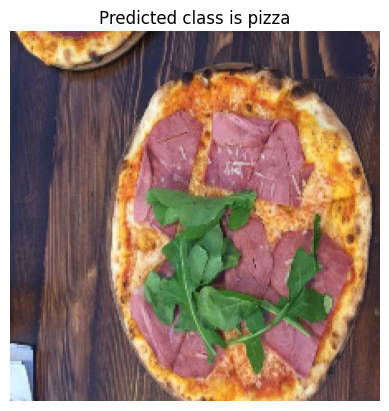

In [141]:
pred_and_plot("/content/ince-hamurlu-uygun-fiyatli.jpg")

In [147]:
!wget https://nypost.com/wp-content/uploads/sites/2/2023/10/NYPICHPDPICT000053299825.jpg?quality=75&strip=all&w=1024

--2024-01-25 07:35:52--  https://nypost.com/wp-content/uploads/sites/2/2023/10/NYPICHPDPICT000053299825.jpg?quality=75
Resolving nypost.com (nypost.com)... 192.0.66.32
Connecting to nypost.com (nypost.com)|192.0.66.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4476589 (4.3M) [image/jpeg]
Saving to: ‘NYPICHPDPICT000053299825.jpg?quality=75’

NYPICHPDPICT0000532 100%[===================>]   4.27M  21.6MB/s    in 0.2s    

2024-01-25 07:35:53 (21.6 MB/s) - ‘NYPICHPDPICT000053299825.jpg?quality=75’ saved [4476589/4476589]



1/1 [==============================] - 0s 38ms/step


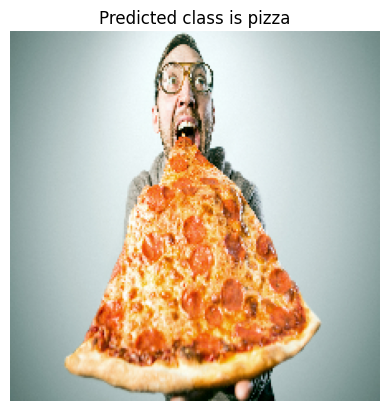

In [148]:
pred_and_plot("NYPICHPDPICT000053299825.jpg?quality=75")

## Multi-class Image Classification.
So far, we have worked on binary classification. Now it's time for multiclass.

In [149]:
import zipfile

!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip

--2024-01-25 07:44:36--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.202.207, 173.194.203.207, 74.125.20.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.202.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip’

10_food_classes_all 100%[===================>] 495.13M  88.4MB/s    in 6.9s    

2024-01-25 07:44:43 (72.0 MB/s) - ‘10_food_classes_all_data.zip’ saved [519183241/519183241]



In [150]:
zip_ref = zipfile.ZipFile("10_food_classes_all_data.zip", "r")
zip_ref.extractall()
zip_ref.close()

In [155]:
import os

for dirpath, dirnames, filenames in os.walk("10_food_classes_all_data"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 2 directories and 0 images in '10_food_classes_all_data'.
There are 10 directories and 0 images in '10_food_classes_all_data/test'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/sushi'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/steak'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ice_cream'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/fried_rice'.
There are 

In [156]:
train_dir = "10_food_classes_all_data/train"
test_dir = "10_food_classes_all_data/test"

In [157]:
import pathlib
import numpy as np
data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


['3528567.jpg']
Image shape: (512, 512, 3)


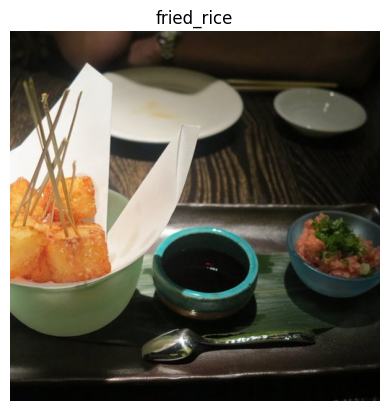

In [162]:
import random
img = view_random_image(target_dir=train_dir,
                        target_class=random.choice(class_names))

In [163]:
def multiple_random(iterations):
  for i in range(iterations):
    plt.figure()
    img = view_random_image(target_dir=train_dir,
                        target_class=random.choice(class_names))

['3374126.jpg']
Image shape: (512, 512, 3)
['280869.jpg']
Image shape: (382, 512, 3)


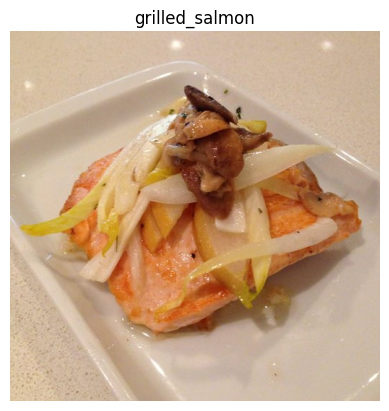

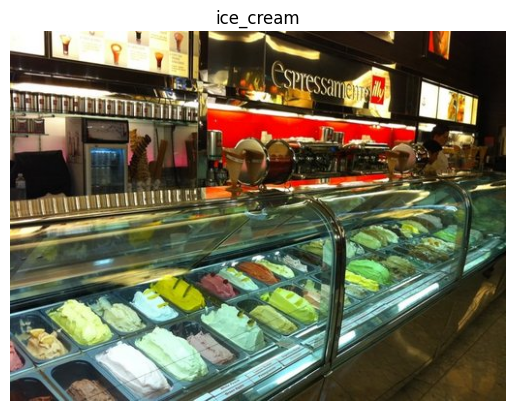

In [164]:
multiple_random(2)

In [165]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

In [170]:
train_data = train_datagen.flow_from_directory(directory=train_dir,
                                               target_size=(224, 224),
                                               class_mode='categorical',
                                               batch_size=32)

test_data = test_datagen.flow_from_directory(directory=test_dir,
                                             target_size=(224, 224),
                                             class_mode='categorical',
                                             batch_size=32)

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


In [171]:
images, labels = train_data.next()
len(images), len(labels)

(32, 32)

In [172]:
images[:2], images[0].shape

(array([[[[0.01176471, 0.01960784, 0.00784314],
          [0.00784314, 0.01568628, 0.00392157],
          [0.00392157, 0.01176471, 0.        ],
          ...,
          [0.01176471, 0.01568628, 0.02352941],
          [0.01176471, 0.01568628, 0.02352941],
          [0.01176471, 0.01568628, 0.02352941]],
 
         [[0.00784314, 0.01568628, 0.00392157],
          [0.00392157, 0.01176471, 0.        ],
          [0.00392157, 0.01176471, 0.        ],
          ...,
          [0.01176471, 0.01568628, 0.02352941],
          [0.01176471, 0.01568628, 0.02352941],
          [0.01176471, 0.01568628, 0.02352941]],
 
         [[0.00392157, 0.01176471, 0.        ],
          [0.00392157, 0.01176471, 0.        ],
          [0.00784314, 0.01568628, 0.00392157],
          ...,
          [0.01176471, 0.01568628, 0.02352941],
          [0.01176471, 0.01568628, 0.02352941],
          [0.01176471, 0.01568628, 0.02352941]],
 
         ...,
 
         [[0.24313727, 0.2901961 , 0.3529412 ],
          [0.24705

In [173]:
labels

array([[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 

In [175]:
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, Dense, MaxPool2D, Flatten, Activation

model_10 = Sequential([
    Conv2D(10, 3, input_shape=(224, 224, 3)),
    Activation(activation="relu"),
    Conv2D(10, 3),
    Activation(activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3),
    Activation(activation="relu"),
    Conv2D(10, 3),
    Activation(activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(10),
    Activation(activation="softmax")
])

model_10.compile(loss="categorical_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

In [177]:
history_10 = model_10.fit(train_data,
                          epochs=5,
                          steps_per_epoch=(len(train_data)),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5
235/235 [==============================] - 31s 118ms/step - loss: 2.1196 - accuracy: 0.2287 - val_loss: 1.9887 - val_accuracy: 0.3084
Epoch 2/5
235/235 [==============================] - 32s 137ms/step - loss: 1.9375 - accuracy: 0.3228 - val_loss: 1.8527 - val_accuracy: 0.3580
Epoch 3/5
235/235 [==============================] - 27s 116ms/step - loss: 1.7651 - accuracy: 0.3933 - val_loss: 1.8607 - val_accuracy: 0.3608
Epoch 4/5
235/235 [==============================] - 28s 118ms/step - loss: 1.4807 - accuracy: 0.5087 - val_loss: 1.9374 - val_accuracy: 0.3520
Epoch 5/5
235/235 [==============================] - 27s 114ms/step - loss: 0.9323 - accuracy: 0.7003 - val_loss: 2.4219 - val_accuracy: 0.3028


In [178]:
model_10.evaluate(test_data)

79/79 [==============================] - 6s 79ms/step - loss: 2.4219 - accuracy: 0.3028


[2.4218850135803223, 0.3027999997138977]

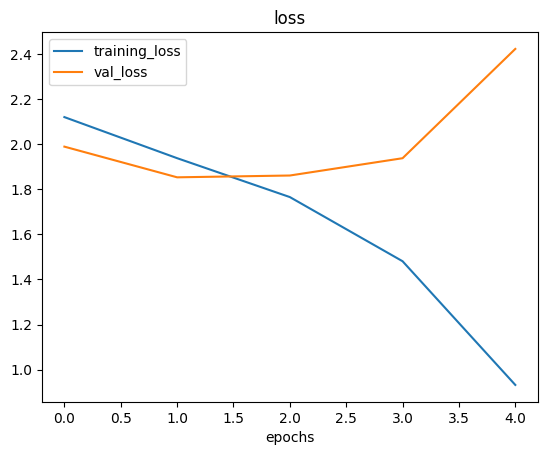

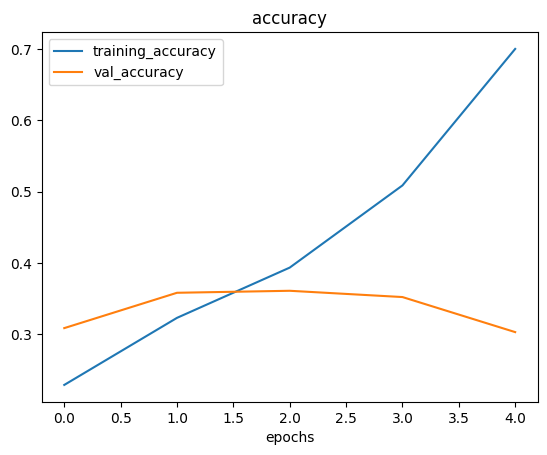

In [179]:
plot_loss_curves(history_10)

In [180]:
model_11 = Sequential([
    Conv2D(10, 3, input_shape=(224, 224, 3)),
    Activation(activation="relu"),
    MaxPool2D(),
    Conv2D(10, 3),
    Activation(activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(10),
    Activation(activation="softmax")
])

model_11.compile(loss="categorical_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

history_11 = model_11.fit(train_data,
                          epochs=5,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5
235/235 [==============================] - 29s 113ms/step - loss: 2.1083 - accuracy: 0.2447 - val_loss: 1.9596 - val_accuracy: 0.3260
Epoch 2/5
235/235 [==============================] - 25s 108ms/step - loss: 1.7676 - accuracy: 0.4019 - val_loss: 1.8798 - val_accuracy: 0.3488
Epoch 3/5
235/235 [==============================] - 27s 114ms/step - loss: 1.3415 - accuracy: 0.5659 - val_loss: 1.9819 - val_accuracy: 0.3340
Epoch 4/5
235/235 [==============================] - 26s 108ms/step - loss: 0.8901 - accuracy: 0.7217 - val_loss: 2.1397 - val_accuracy: 0.3264
Epoch 5/5
235/235 [==============================] - 28s 118ms/step - loss: 0.4903 - accuracy: 0.8644 - val_loss: 2.5288 - val_accuracy: 0.3264


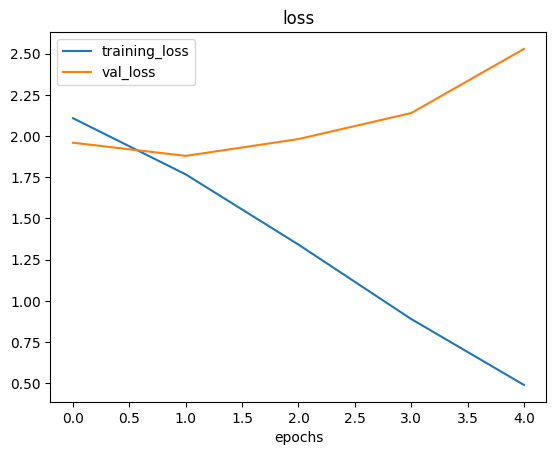

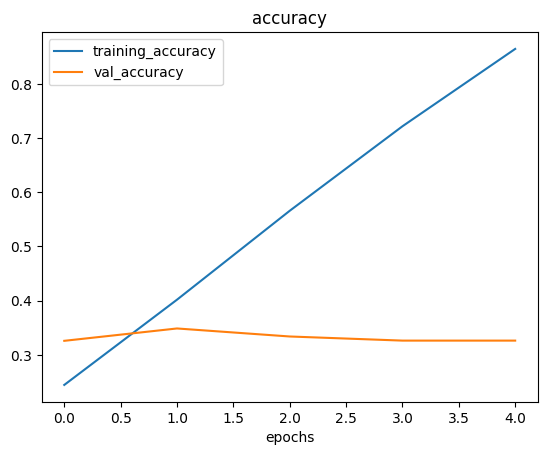

In [182]:
plot_loss_curves(history_11)

In [183]:
model_10.summary(), model_11.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_23 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 activation (Activation)     (None, 222, 222, 10)      0         
                                                                 
 conv2d_24 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 activation_1 (Activation)   (None, 220, 220, 10)      0         
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 110, 110, 10)      0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 108, 108, 10)      910       
                                                      

(None, None)

Removing the layers added even more parameters and caused even more overfitting. Next experiment will be data augmentation.

In [192]:
train_datagen_augmented = ImageDataGenerator(rescale=1/255.,
                                             rotation_range=0.2,
                                             width_shift_range=0.2,
                                             height_shift_range=0.2,
                                             zoom_range=0.2,
                                             horizontal_flip=True)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                  target_size=(224, 224),
                                                                  batch_size=32,
                                                                  class_mode="categorical")

Found 7500 images belonging to 10 classes.


In [193]:
model_12 = tf.keras.models.clone_model(model_10)

model_12.compile(loss="categorical_crossentropy",
                 optimizer=Adam(),
                 metrics=["accuracy"])

In [194]:
model_10.summary(), model_12.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_23 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 activation (Activation)     (None, 222, 222, 10)      0         
                                                                 
 conv2d_24 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 activation_1 (Activation)   (None, 220, 220, 10)      0         
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 110, 110, 10)      0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 108, 108, 10)      910       
                                                      

(None, None)

In [195]:
history_12 = model_12.fit(train_data_augmented,
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5
235/235 [==============================] - 104s 438ms/step - loss: 2.1699 - accuracy: 0.2089 - val_loss: 2.0270 - val_accuracy: 0.2844
Epoch 2/5
235/235 [==============================] - 113s 479ms/step - loss: 2.0654 - accuracy: 0.2584 - val_loss: 1.9795 - val_accuracy: 0.3064
Epoch 3/5
235/235 [==============================] - 101s 431ms/step - loss: 2.0256 - accuracy: 0.2808 - val_loss: 1.9414 - val_accuracy: 0.3196
Epoch 4/5
235/235 [==============================] - 104s 444ms/step - loss: 2.0073 - accuracy: 0.2929 - val_loss: 1.8553 - val_accuracy: 0.3668
Epoch 5/5
235/235 [==============================] - 103s 440ms/step - loss: 1.9686 - accuracy: 0.3125 - val_loss: 1.8055 - val_accuracy: 0.3900


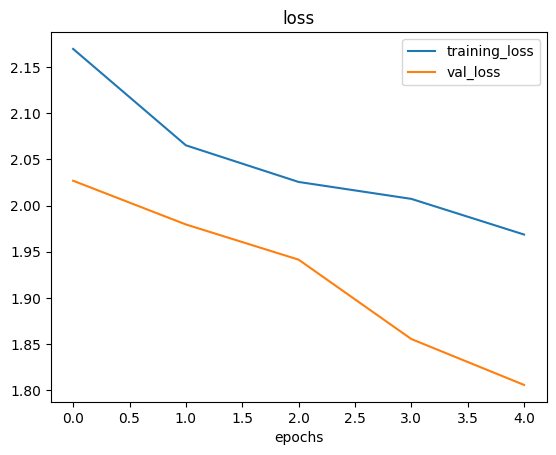

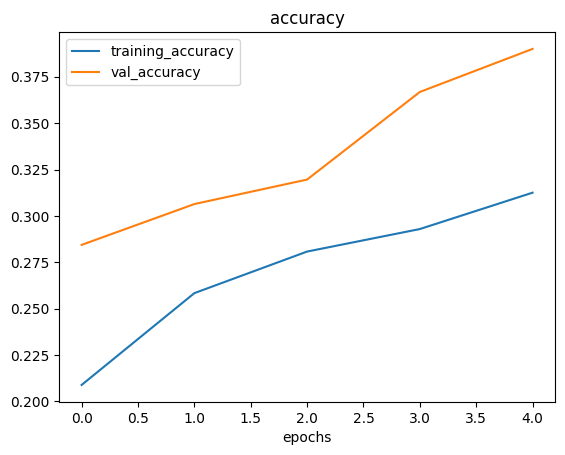

In [196]:
plot_loss_curves(history_12)

In [197]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [223]:
def pred_and_plot_multiclass(filename, model=model_12, class_names=class_names):
  image = load_and_prep_image(filename)
  pred = model.predict(tf.expand_dims(image, axis=0))
  pred_class = class_names[np.argmax(pred)]
  plt.imshow(image)
  plt.title(f"Predicted class is {pred_class}")
  plt.axis(False)

In [207]:
!wget -O chicken_curry https://www.shutterstock.com/image-photo/tasty-butter-chicken-curry-dish-600nw-2360173335.jpg

--2024-01-25 09:12:46--  https://www.shutterstock.com/image-photo/tasty-butter-chicken-curry-dish-600nw-2360173335.jpg
Resolving www.shutterstock.com (www.shutterstock.com)... 99.86.38.44, 99.86.38.97, 99.86.38.4, ...
Connecting to www.shutterstock.com (www.shutterstock.com)|99.86.38.44|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 52963 (52K) [image/jpeg]
Saving to: ‘chicken_curry’

chicken_curry       100%[===================>]  51.72K  --.-KB/s    in 0.006s  

2024-01-25 09:12:46 (7.98 MB/s) - ‘chicken_curry’ saved [52963/52963]



In [208]:
!wget -O chicken_wings https://www.shutterstock.com/image-photo/air-fryer-chicken-wings-glazed-600nw-2286706431.jpg

--2024-01-25 09:13:07--  https://www.shutterstock.com/image-photo/air-fryer-chicken-wings-glazed-600nw-2286706431.jpg
Resolving www.shutterstock.com (www.shutterstock.com)... 99.86.38.44, 99.86.38.97, 99.86.38.4, ...
Connecting to www.shutterstock.com (www.shutterstock.com)|99.86.38.44|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 82212 (80K) [image/jpeg]
Saving to: ‘chicken_wings’

chicken_wings       100%[===================>]  80.29K  --.-KB/s    in 0.01s   

2024-01-25 09:13:07 (6.82 MB/s) - ‘chicken_wings’ saved [82212/82212]



In [211]:
!wget -O fried_rice https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcROEOYq8Lb7DqOovIwkCzTdwtg5xHsDoN-ZHWUwD_Y56Q&s

/bin/bash: line 1: s: command not found
--2024-01-25 09:14:28--  https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcROEOYq8Lb7DqOovIwkCzTdwtg5xHsDoN-ZHWUwD_Y56Q
Resolving encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)... 74.125.197.100, 74.125.197.139, 74.125.197.113, ...
Connecting to encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)|74.125.197.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19475 (19K) [image/jpeg]
Saving to: ‘fried_rice’

fried_rice          100%[===================>]  19.02K  --.-KB/s    in 0s      

2024-01-25 09:14:28 (79.3 MB/s) - ‘fried_rice’ saved [19475/19475]



In [213]:
!wget -O grilled_salmon https://www.acouplecooks.com/wp-content/uploads/2020/05/Grilled-Salmon-015-1.jpg

--2024-01-25 09:15:29--  https://www.acouplecooks.com/wp-content/uploads/2020/05/Grilled-Salmon-015-1.jpg
Resolving www.acouplecooks.com (www.acouplecooks.com)... 104.18.7.55, 104.18.6.55, 2606:4700::6812:737, ...
Connecting to www.acouplecooks.com (www.acouplecooks.com)|104.18.7.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 259038 (253K) [image/jpeg]
Saving to: ‘grilled_salmon’

grilled_salmon      100%[===================>] 252.97K  --.-KB/s    in 0.02s   

2024-01-25 09:15:29 (14.7 MB/s) - ‘grilled_salmon’ saved [259038/259038]



In [214]:
!wget -O hamburger https://www.shutterstock.com/image-photo/classic-hamburger-stock-photo-isolated-600w-2282033179.jpg

--2024-01-25 09:15:54--  https://www.shutterstock.com/image-photo/classic-hamburger-stock-photo-isolated-600w-2282033179.jpg
Resolving www.shutterstock.com (www.shutterstock.com)... 99.86.38.59, 99.86.38.97, 99.86.38.4, ...
Connecting to www.shutterstock.com (www.shutterstock.com)|99.86.38.59|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 72598 (71K) [image/jpeg]
Saving to: ‘hamburger’

hamburger           100%[===================>]  70.90K  --.-KB/s    in 0.008s  

2024-01-25 09:15:54 (8.16 MB/s) - ‘hamburger’ saved [72598/72598]



In [216]:
!wget -O ice_cream https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSOSltcAkN67EifrqbYrVq-_dgA08hxfFinAouLRLqPaw&s

/bin/bash: line 1: s: command not found
--2024-01-25 09:16:39--  https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSOSltcAkN67EifrqbYrVq-_dgA08hxfFinAouLRLqPaw
Resolving encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)... 74.125.197.102, 74.125.197.101, 74.125.197.113, ...
Connecting to encrypted-tbn0.gstatic.com (encrypted-tbn0.gstatic.com)|74.125.197.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6848 (6.7K) [image/jpeg]
Saving to: ‘ice_cream’

ice_cream           100%[===================>]   6.69K  --.-KB/s    in 0s      

2024-01-25 09:16:39 (55.8 MB/s) - ‘ice_cream’ saved [6848/6848]



In [217]:
!wget -O pizza https://t3.ftcdn.net/jpg/00/27/57/96/360_F_27579652_tM7V4fZBBw8RLmZo0Bi8WhtO2EosTRFD.jpg

--2024-01-25 09:17:23--  https://t3.ftcdn.net/jpg/00/27/57/96/360_F_27579652_tM7V4fZBBw8RLmZo0Bi8WhtO2EosTRFD.jpg
Resolving t3.ftcdn.net (t3.ftcdn.net)... 151.101.1.167, 151.101.65.167, 151.101.129.167, ...
Connecting to t3.ftcdn.net (t3.ftcdn.net)|151.101.1.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 77678 (76K) [image/jpeg]
Saving to: ‘pizza’

pizza               100%[===================>]  75.86K  --.-KB/s    in 0.007s  

2024-01-25 09:17:23 (10.1 MB/s) - ‘pizza’ saved [77678/77678]



In [220]:
!wget -O ramen https://hips.hearstapps.com/hmg-prod/images/190208-delish-ramen-horizontal-093-1550096715.jpg

--2024-01-25 09:18:13--  https://hips.hearstapps.com/hmg-prod/images/190208-delish-ramen-horizontal-093-1550096715.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.0.155, 151.101.64.155, 151.101.128.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.0.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 121272 (118K) [image/jpeg]
Saving to: ‘ramen’

ramen               100%[===================>] 118.43K  --.-KB/s    in 0.02s   

2024-01-25 09:18:13 (5.71 MB/s) - ‘ramen’ saved [121272/121272]



In [221]:
!wget -O steak https://c8.alamy.com/comp/CY92WM/beef-steak-on-a-wooden-table-CY92WM.jpg

--2024-01-25 09:18:36--  https://c8.alamy.com/comp/CY92WM/beef-steak-on-a-wooden-table-CY92WM.jpg
Resolving c8.alamy.com (c8.alamy.com)... 99.86.38.12, 99.86.38.46, 99.86.38.68, ...
Connecting to c8.alamy.com (c8.alamy.com)|99.86.38.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘steak’

steak                   [ <=>                ] 296.80K  --.-KB/s    in 0.02s   

Last-modified header invalid -- time-stamp ignored.
2024-01-25 09:18:37 (13.1 MB/s) - ‘steak’ saved [303922]



In [222]:
!wget -O sushi https://www.justonecookbook.com/wp-content/uploads/2020/01/Sushi-Rolls-Maki-Sushi-%E2%80%93-Hosomaki-1106-II.jpg

--2024-01-25 09:18:57--  https://www.justonecookbook.com/wp-content/uploads/2020/01/Sushi-Rolls-Maki-Sushi-%E2%80%93-Hosomaki-1106-II.jpg
Resolving www.justonecookbook.com (www.justonecookbook.com)... 172.67.22.245, 104.22.51.139, 104.22.50.139, ...
Connecting to www.justonecookbook.com (www.justonecookbook.com)|172.67.22.245|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 166212 (162K) [image/jpeg]
Saving to: ‘sushi’

sushi               100%[===================>] 162.32K  --.-KB/s    in 0.02s   

2024-01-25 09:18:58 (8.74 MB/s) - ‘sushi’ saved [166212/166212]



In [224]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

1/1 [==============================] - 0s 18ms/step


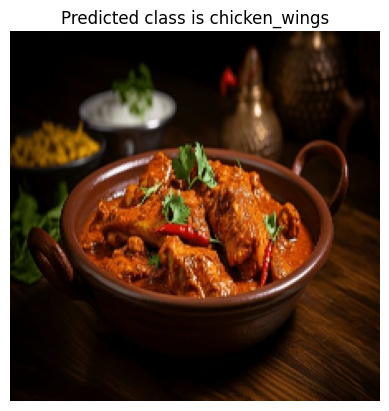

In [225]:
pred_and_plot_multiclass("chicken_curry")

1/1 [==============================] - 0s 28ms/step


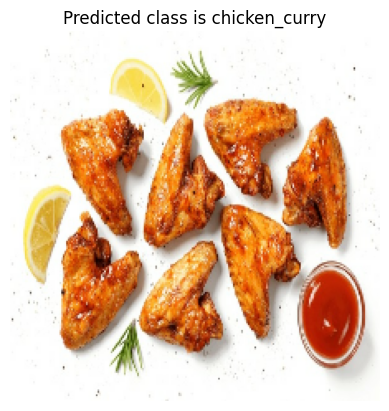

In [226]:
pred_and_plot_multiclass("chicken_wings")

1/1 [==============================] - 0s 19ms/step


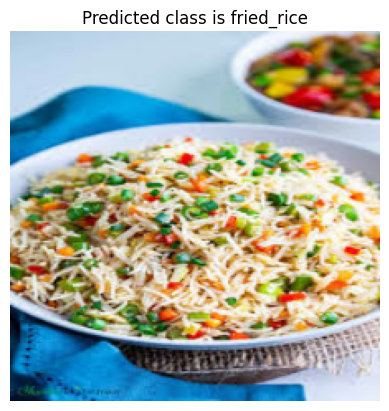

In [227]:
pred_and_plot_multiclass("fried_rice")

1/1 [==============================] - 0s 26ms/step


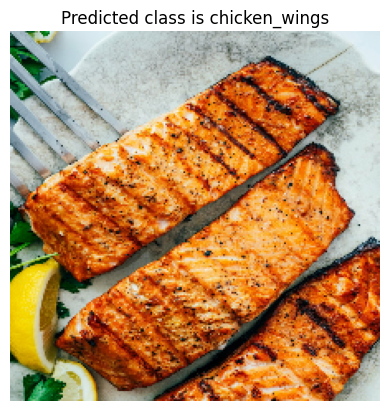

In [228]:
pred_and_plot_multiclass("grilled_salmon")

1/1 [==============================] - 0s 29ms/step


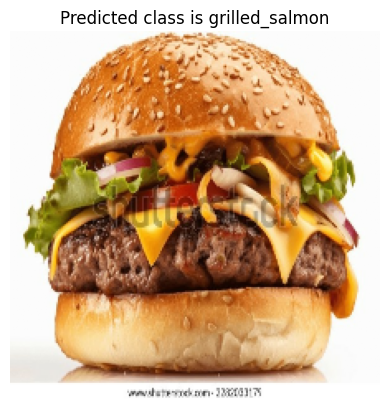

In [229]:
pred_and_plot_multiclass("hamburger")

1/1 [==============================] - 0s 30ms/step


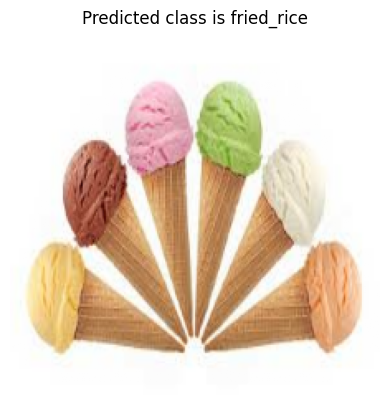

In [230]:
pred_and_plot_multiclass("ice_cream")

1/1 [==============================] - 0s 19ms/step


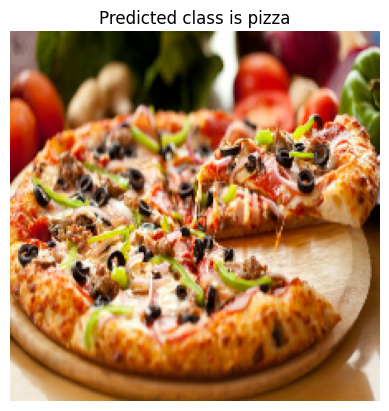

In [231]:
pred_and_plot_multiclass("pizza")

In [232]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

1/1 [==============================] - 0s 18ms/step


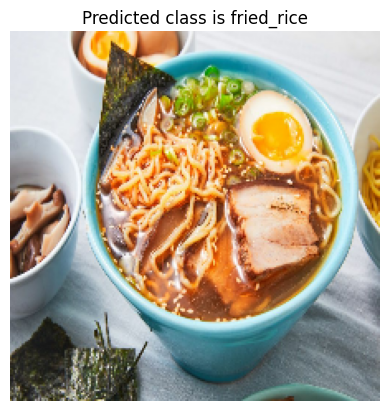

In [233]:
pred_and_plot_multiclass("ramen")

1/1 [==============================] - 0s 17ms/step


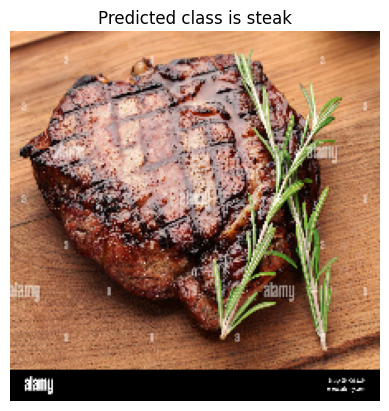

In [234]:
pred_and_plot_multiclass("steak")

1/1 [==============================] - 0s 31ms/step


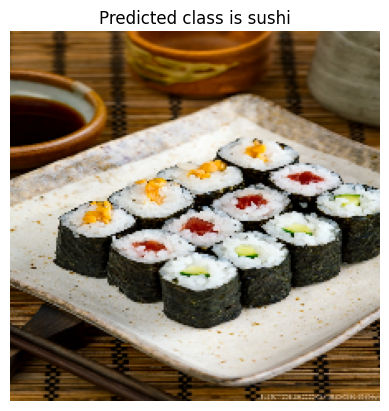

In [235]:
pred_and_plot_multiclass("sushi")